# Chicago Crime Data Analysis
* Author: Bilal Fatian ([@bilalfatian](https://github.com/bilalfatian))
* Created on: April , 2023
* Description: Data exploration and data visualization on Chicago crime dataset from 2001 to present
* Curated dataset: [Chicago Crime dataset](https://data.cityofchicago.org/Public-Safety/Crimes-2001-to-present/ijzp-q8t2)

In [1]:
## Import necessary packages
import pandas as pd
import numpy as np
import folium
from folium import plugins
from folium.plugins import MarkerCluster
import seaborn as sns
import matplotlib.pyplot as plt
import datetime
from scipy.signal import find_peaks

%matplotlib inline

# Set pandas's max row display
pd.set_option('display.max_row', 1000)

# Set pandas's max column width to 50
pd.set_option('display.max_columns', 50)

In [2]:
# Load in the Chicago crime dataset
df = pd.read_csv('./data/Crimes_-_2001_to_present.csv')

### View subset of data

In [3]:
## Print first 5 lines of dataset
df.head()

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,Beat,District,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,5741943,HN549294,08/25/2007 09:22:18 AM,074XX N ROGERS AVE,0560,ASSAULT,SIMPLE,OTHER,False,False,2422,24.0,49.0,1.0,08A,NaN,NaN,2007,08/17/2015 03:03:40 PM,NaN,NaN,NaN
1,25953,JE240540,05/24/2021 03:06:00 PM,020XX N LARAMIE AVE,0110,HOMICIDE,FIRST DEGREE MURDER,STREET,True,False,2515,25.0,36.0,19.0,01A,1141387.0,1913179.0,2021,11/18/2023 03:39:49 PM,41.917838,-87.755969,"(41.917838056, -87.755968972)"
2,26038,JE279849,06/26/2021 09:24:00 AM,062XX N MC CORMICK RD,0110,HOMICIDE,FIRST DEGREE MURDER,PARKING LOT,True,False,1711,17.0,50.0,13.0,01A,1152781.0,1941458.0,2021,11/18/2023 03:39:49 PM,41.995219,-87.713355,"(41.995219444, -87.713354912)"
3,13279676,JG507211,11/09/2023 07:30:00 AM,019XX W BYRON ST,0620,BURGLARY,UNLAWFUL ENTRY,APARTMENT,False,False,1922,19.0,47.0,5.0,05,1162518.0,1925906.0,2023,11/18/2023 03:39:49 PM,41.952345,-87.677975,"(41.952345086, -87.677975059)"
4,13274752,JG501049,11/12/2023 07:59:00 AM,086XX S COTTAGE GROVE AVE,0454,BATTERY,"AGGRAVATED P.O. - HANDS, FISTS, FEET, NO / MIN...",SMALL RETAIL STORE,True,False,632,6.0,6.0,44.0,08B,1183071.0,1847869.0,2023,12/09/2023 03:41:24 PM,41.737751,-87.604856,"(41.737750767, -87.604855911)"


In [4]:
## Print last 5 lines of dataset
df.tail()

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,Beat,District,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
8047974,13047495,JG229914,04/18/2023 08:00:00 AM,003XX N JEFFERSON ST,1154,DECEPTIVE PRACTICE,FINANCIAL IDENTITY THEFT $300 AND UNDER,APARTMENT,False,False,1214,12.0,42.0,28.0,11,1172269.0,1902384.0,2023,08/19/2023 03:40:26 PM,41.887589,-87.642827,"(41.887589411, -87.642826595)"
8047975,13168300,JG373901,08/07/2023 06:00:00 PM,0000X W 95TH ST,031A,ROBBERY,ARMED - HANDGUN,SIDEWALK,False,False,634,6.0,9.0,49.0,03,1177527.0,1841973.0,2023,08/19/2023 03:40:26 PM,41.721698,-87.625345,"(41.72169837, -87.625345212)"
8047976,13114024,JG309527,06/20/2023 07:00:00 PM,031XX S AVERS AVE,0910,MOTOR VEHICLE THEFT,AUTOMOBILE,STREET,False,False,1031,10.0,22.0,30.0,07,1151205.0,1883542.0,2023,08/19/2023 03:40:26 PM,41.836324,-87.720674,"(41.836323827, -87.720674149)"
8047977,13188860,JG398340,08/26/2023 12:00:00 AM,078XX S SOUTH SHORE DR,1320,CRIMINAL DAMAGE,TO VEHICLE,STREET,False,False,421,4.0,7.0,46.0,14,1198338.0,1853426.0,2023,09/02/2023 03:41:45 PM,41.752631,-87.548737,"(41.752631346, -87.548737069)"
8047978,13126372,JG324067,07/01/2023 07:29:00 PM,005XX S WELLS ST,1320,CRIMINAL DAMAGE,TO VEHICLE,STREET,False,True,123,1.0,34.0,32.0,14,1174805.0,1897873.0,2023,08/19/2023 03:40:26 PM,41.875155,-87.633649,"(41.87515458, -87.633648765)"


In [5]:
df.columns

Index(['ID', 'Case Number', 'Date', 'Block', 'IUCR', 'Primary Type',
       'Description', 'Location Description', 'Arrest', 'Domestic', 'Beat',
       'District', 'Ward', 'Community Area', 'FBI Code', 'X Coordinate',
       'Y Coordinate', 'Year', 'Updated On', 'Latitude', 'Longitude',
       'Location'],
      dtype='object')

## What crimes are most prevalent in Chicago?

In [6]:
## Check if any rows are missing data and are null
df['Primary Type'].isnull().values.any()

False

In [7]:
## Count number of observations for each crime
df['Primary Type'].value_counts()

Primary Type
THEFT                                1700171
BATTERY                              1467840
CRIMINAL DAMAGE                       917074
NARCOTICS                             753300
ASSAULT                               530230
OTHER OFFENSE                         499913
BURGLARY                              431749
MOTOR VEHICLE THEFT                   402374
DECEPTIVE PRACTICE                    362952
ROBBERY                               303377
CRIMINAL TRESPASS                     218993
WEAPONS VIOLATION                     114852
PROSTITUTION                           70027
OFFENSE INVOLVING CHILDREN             57706
PUBLIC PEACE VIOLATION                 53201
SEX OFFENSE                            32167
CRIM SEXUAL ASSAULT                    27495
INTERFERENCE WITH PUBLIC OFFICER       18986
LIQUOR LAW VIOLATION                   15094
GAMBLING                               14635
ARSON                                  13763
HOMICIDE                               131

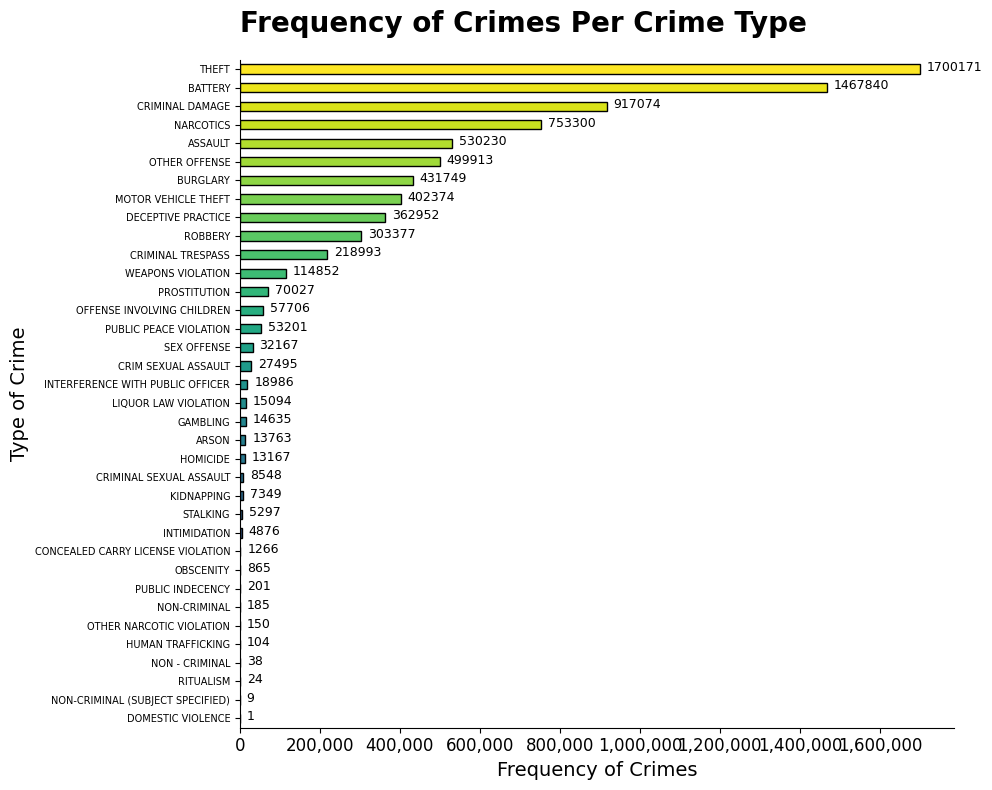

In [9]:
crime_type_df = df['Primary Type'].value_counts(ascending=True)

colors = plt.cm.viridis(np.linspace(0, 1, len(crime_type_df)))

# Plotting
fig, ax = plt.subplots(figsize=(10, 8))
crime_type_df.plot(kind='barh', color=colors, ax=ax, edgecolor='black')

plt.title("Frequency of Crimes Per Crime Type", fontsize=20, fontweight='bold', color='black', loc='left', pad=20)
plt.xlabel("Frequency of Crimes", fontsize=14)
plt.ylabel("Type of Crime", fontsize=14)

ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))
ax.grid(axis='x')

plt.xticks(fontsize=12)
plt.yticks(fontsize=7)

plt.grid(False)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Add data labels
max_value = crime_type_df.max()
for i, v in enumerate(crime_type_df):
    plt.text(v + max_value * 0.01, i - 0.1, str(v), color='black', fontsize=9)  # Adjusted position dynamically based on max value

plt.tight_layout()
plt.show()

## What year had the most crime?

In [10]:
## Check if any rows are missing data and are null
df['Year'].isnull().values.any()

False

In [11]:
## Count number of reported crimes for each year
df['Year'].value_counts()

Year
2002    486816
2001    485910
2003    475989
2004    469430
2005    453778
2006    448187
2007    437089
2008    427197
2009    392841
2010    370534
2011    352009
2012    336329
2013    307561
2014    275826
2016    269886
2017    269165
2018    268993
2015    264837
2023    261663
2019    261456
2022    239315
2020    212394
2021    209196
2024     71578
Name: count, dtype: int64

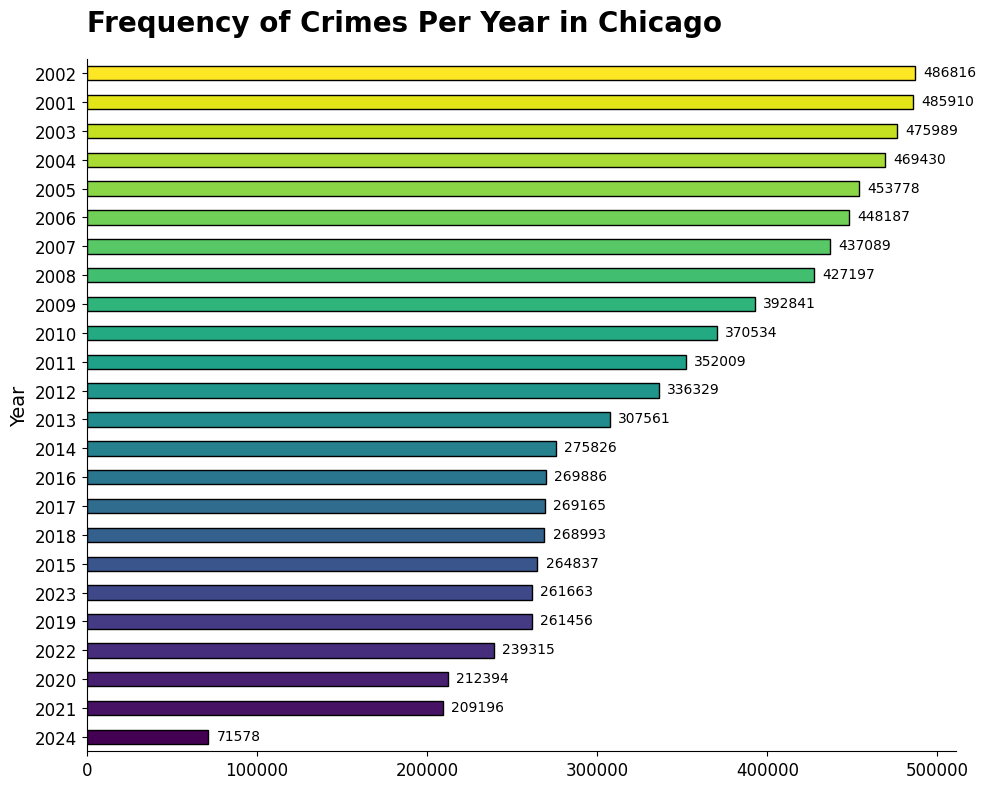

In [12]:
crime_year_df = df['Year'].value_counts(ascending=True)

colors = plt.cm.viridis(np.linspace(0, 1, len(crime_year_df)))

# Plot these for better visualization
crime_year_df = df['Year'].value_counts(ascending=True)

# Some formatting to make it look nicer
plt.figure(figsize=(10, 8))
plt.title("Frequency of Crimes Per Year in Chicago", fontsize=20, fontweight='bold', color='black', loc='left', pad=20)
plt.xlabel("Frequency of Crimes", fontsize=14)
plt.ylabel("Year", fontsize=14)
ax = crime_year_df.plot(kind='barh', color=colors, edgecolor='black')
ax.tick_params(axis='both', which='major', labelsize=12)

plt.grid(False)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Add data labels
max_value = crime_year_df.max()
for i, v in enumerate(crime_year_df):
    plt.text(v + max_value * 0.01, i - 0.1, str(v), color='black', fontsize=10)  # Adjusted position dynamically based on max value

plt.tight_layout()
plt.show()


## What percentage of arrests were successful?

In [13]:
## Check if any rows are missing data and are null
df['Arrest'].isnull().values.any()

False

In [14]:
## Count number of successful arrests for each year
df['Arrest'].value_counts()

Arrest
False    5980009
True     2067970
Name: count, dtype: int64

In [15]:
## Convert values into percentages
arrest_df = df['Arrest'].value_counts()
arrest_percent = (arrest_df / df['Arrest'].sum()) * 100 

## Rename Series.name
arrest_percent.rename("% of Arrests",inplace=True)

## Rename True and False to % Arrested and % Not Arrested
arrest_percent.rename({True: '% Arrested', False: '% Not Arrested'},inplace=True)

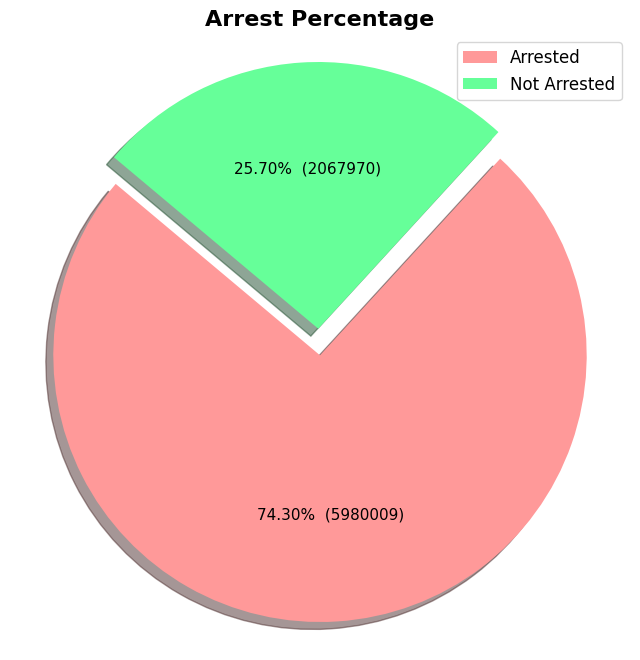

In [16]:
# Define a function to create autopct
def make_autopct(values):
    def my_autopct(pct):
        total = sum(values)
        val = int(round(pct*total/100.0))
        return '{p:.2f}%  ({v:d})'.format(p=pct, v=val)
    return my_autopct

# Define colors for the pie chart (red and green)
colors = ['#ff9999', '#66ff99']

# Explode a slice for emphasis
explode = (0.1, 0)

# Plot results in a pie chart
plt.figure(figsize=(8, 8))
patches, texts, autotexts = plt.pie(arrest_percent, colors=colors, autopct=make_autopct(df['Arrest'].value_counts()), startangle=140, explode=explode, shadow=True, textprops={'fontsize': 11})
plt.title("Arrest Percentage", fontsize=16, fontweight='bold')

# Adjust legend
plt.legend(patches, ['Arrested', 'Not Arrested'], loc="best", fontsize=12)

plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()


## What are the successful arrest percentages per year?

In [17]:
## Group dataset by year and arrests
arrest_per_year = df.groupby('Year')['Arrest'].value_counts().rename('Counts').to_frame()
arrest_per_year['Percentage'] = (100 * arrest_per_year / arrest_per_year.groupby(level=0).sum())
arrest_per_year.reset_index(level=[1],inplace=True)
arrest_per_year

,Arrest,Counts,Percentage
Year,,,
2001,False,343970,70.788829
2001,True,141940,29.211171
2002,False,345244,70.918787
2002,True,141572,29.081213
2003,False,334391,70.251834
2003,True,141598,29.748166
2004,False,324727,69.174744
2004,True,144703,30.825256
2005,False,312852,68.943845


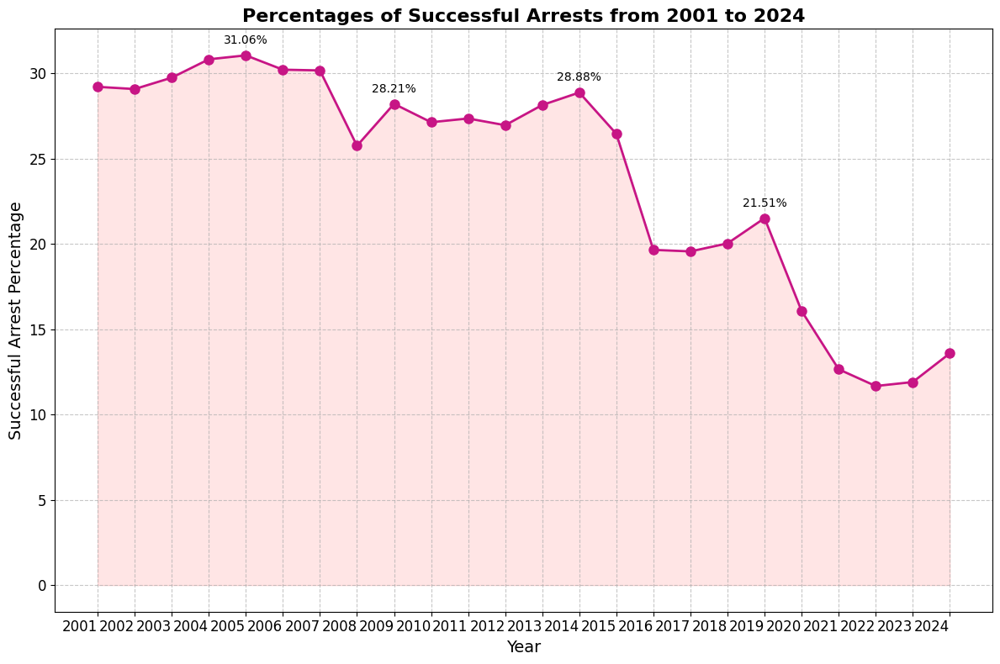

In [18]:
# Create a line plot for percentages of successful arrests over time (2001 to present)
line_plot = arrest_per_year[arrest_per_year['Arrest'] == True]['Percentage']

# Find peaks
peaks, _ = find_peaks(line_plot, prominence=1)

# Configure line plot
fig, ax = plt.subplots(figsize=(12, 8))
plt.title('Percentages of Successful Arrests from 2001 to 2024', fontsize=16, fontweight='bold')
plt.xlabel("Year", fontsize=14)
plt.ylabel("Successful Arrest Percentage", fontsize=14)
plt.xticks(line_plot.index, line_plot.index, rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)

line_plot.plot(marker='o', color='mediumvioletred', linewidth=2, markersize=8)

plt.grid(True, linestyle='--', alpha=0.7)

# Add data labels at peaks
for peak in peaks:
    plt.annotate(f"{line_plot.iloc[peak]:.2f}%", (line_plot.index[peak], line_plot.iloc[peak]), textcoords="offset points", xytext=(0,10), ha='center', fontsize=10)

x = line_plot.index
y = line_plot.values
ax.fill_between(x, y, color='red', alpha=0.1)

plt.tight_layout()
plt.show()


## Data visualization for crimes commited since 2023

In [19]:
## Clean data, create copy, and filter based on January 2023
cleaned_df = df[df['Latitude'].notnull() & df['Longitude'].notnull()].copy()
cleaned_df['Date Time'] = pd.to_datetime(cleaned_df['Date'], format='%m/%d/%Y %I:%M:%S %p')
cleaned_df = cleaned_df[cleaned_df['Date Time']  > datetime.datetime(2023, 1, 1)]
print("Number of crimes in Chicago since start January 2023: %d" % len(cleaned_df))

Number of crimes in Chicago since start January 2023: 332925


In [20]:
## Create map and markers for each crime in Chicago January 2023 using folium 
crimes_map = folium.Map(location=[cleaned_df['Latitude'].mean(), cleaned_df['Longitude'].mean()], zoom_start=10)
marker_cluster = MarkerCluster().add_to(crimes_map)

### Show the first 750 values so folium map can properly render inline in Google Chrome

In [21]:
## Show first 750 values so folium map can properly render inline in Google Chrome
for row in cleaned_df.values[:750]:
    popup = "<p> Crime ID: " + str(row[0]) +  "<br> Date and Time: " + row[2] + "<br> Crime Type: " + row[5] + "<br> Crime Description: " + row[6] + "<br> Address: " + row[3] + "</p>"
    folium.Marker([row[19], row[20]], popup=popup).add_to(marker_cluster)
crimes_map

In [22]:
crimes_map.save('./map/January-2023-chicago-crimes.html')

In [23]:
## Create heat map of crimes in Chicago January 2023
crimes_heatmap = folium.Map(location=[cleaned_df['Latitude'].mean(), cleaned_df['Longitude'].mean()], zoom_start=10)
crimes_heatmap.add_child(plugins.HeatMap([[row[20], row[21]] for row in cleaned_df.itertuples()]))
crimes_heatmap

In [24]:
crimes_heatmap.save("./map/January-2023-chicago-crime-heatmap.html")

## Data visualization for crimes based on district from 2001 to present

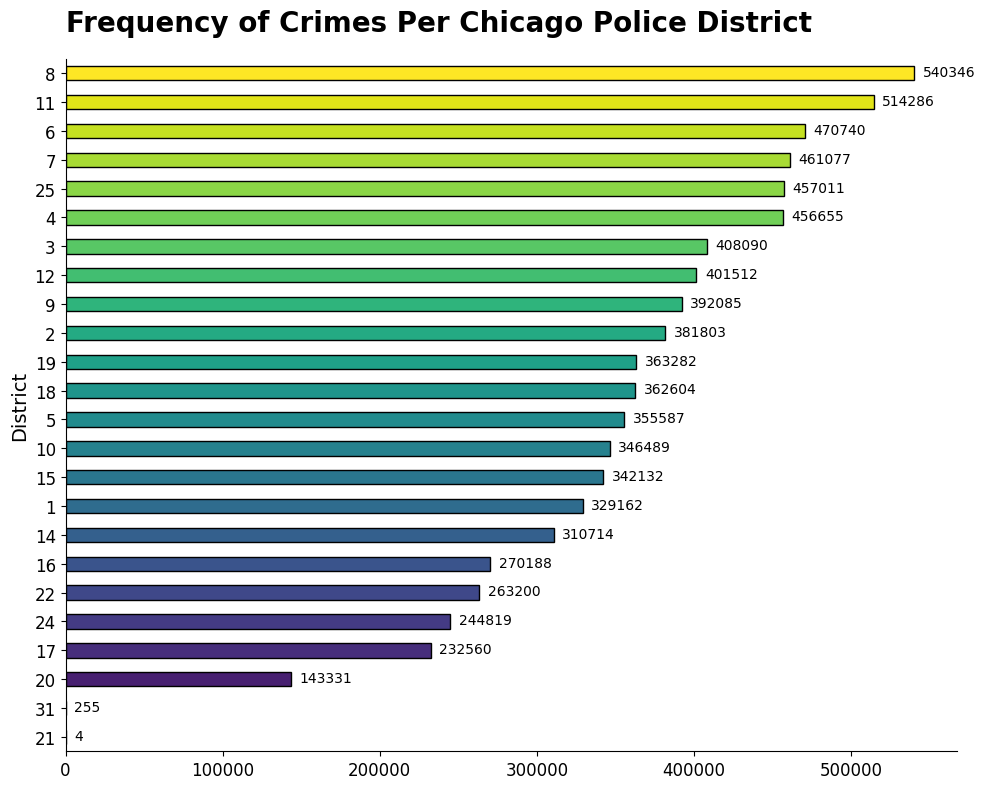

In [25]:
# Calculating total number of incidents per district
district_crime = df['District'].value_counts(ascending=True)

## Data cleaning
district_crime.index = district_crime.index.astype(int)
district_crime.index = district_crime.index.astype(str)

## Plot bar graph for initial visualization
fig=plt.figure(figsize=(10, 8))
plt.title("Frequency of Crimes Per Chicago Police District", fontsize=20, fontweight='bold', color='black', loc='left', pad=20)
plt.xlabel("Frequency of Crimes", fontsize=14)
plt.ylabel("Chicago Police District No.", fontsize=14)

# Define colors
colors = plt.cm.viridis(np.linspace(0, 1, len(district_crime)))

ax = district_crime.plot(kind='barh', color=colors, edgecolor='black')
ax.tick_params(axis='both', which='major', labelsize=12)

plt.grid(False)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

# Add data labels
max_value = district_crime.max()
for i, v in enumerate(district_crime):
    plt.text(v + max_value * 0.01, i - 0.1, str(v), color='black', fontsize=10)  # Adjusted position dynamically based on max value

plt.tight_layout()
plt.show()


In [26]:
## Reset index and name the district and crime count columns
district_crime = district_crime.reset_index()
district_crime.columns = ['District', 'Count']

In [27]:
# Define the threshold scale using a logarithmic scale
threshold_scale = list(np.logspace(np.log10(district_crime['Count'].min()), np.log10(district_crime['Count'].max()), 6))

# Creation of the choropleth
geo_path = 'data/Boundaries - Police Districts (current).geojson'
district_map = folium.Map(location=[cleaned_df['Latitude'].mean(), cleaned_df['Longitude'].mean()], zoom_start=10)

folium.Choropleth(
    geo_data=geo_path,
    name='choropleth',
    data=district_crime,
    threshold_scale=threshold_scale,
    columns=['District', 'Count'],
    key_on='feature.properties.dist_num',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Frequency of crimes per district',
    highlight=True
).add_to(district_map)

district_map.save("./map/Crime-per-district-choropleth.html")



In [28]:
district_map